GET DATA FROM XML

In [ ]:
import numpy as np
import pandas as pd
import os
from xml.etree import ElementTree


def get_category(category_file):
    class_list = []
    with open(category_file, 'r') as f:
        for line in f.readlines():
            class_list.append(line.rstrip('\n'))

    return class_list


class XML_preprocessor(object):

    def __init__(self, data_path, num_classes, normalize=False):
        self.path_prefix = data_path
        self.num_classes = num_classes
        self.normalization = normalize
        self.data = dict()
        self._preprocess_XML()

    def _preprocess_XML(self):
        filenames = os.listdir(self.path_prefix)
        for filename in filenames:
            tree = ElementTree.parse(os.path.join(self.path_prefix, filename))
            root = tree.getroot()
            bounding_boxes = []
            one_hot_classes = []
            size_tree = root.find('size')
            width = float(size_tree.find('width').text)
            height = float(size_tree.find('height').text)
            for object_tree in root.findall('object'):
                for bounding_box in object_tree.iter('bndbox'):
                    if self.normalization:
                        xmin = float(bounding_box.find('xmin').text)/width
                        ymin = float(bounding_box.find('ymin').text)/height
                        xmax = float(bounding_box.find('xmax').text)/width
                        ymax = float(bounding_box.find('ymax').text)/height
                    else:
                        xmin = float(bounding_box.find('xmin').text)
                        ymin = float(bounding_box.find('ymin').text)
                        xmax = float(bounding_box.find('xmax').text)
                        ymax = float(bounding_box.find('ymax').text)
                bounding_box = [xmin, ymin, xmax, ymax]
                bounding_boxes.append(bounding_box)
                class_name = object_tree.find('name').text
                one_hot_class = self._to_one_hot(class_name)
                one_hot_classes.append(one_hot_class)
            # image_name = root.find('filename').text
            image_name = filename
            bounding_boxes = np.asarray(bounding_boxes)
            one_hot_classes = np.asarray(one_hot_classes)
            image_data = np.hstack((bounding_boxes, one_hot_classes))
            self.data[image_name] = image_data

    def _to_one_hot(self, name):
        one_hot_vector = [0] * self.num_classes
        if name == 'A' or name == 'a':
            one_hot_vector[0] = 1
        elif name == 'B' or name == 'b':
            one_hot_vector[1] = 1
        elif name == 'E' or name == 'e':
            one_hot_vector[2] = 1
        elif name == 'G' or name == 'g':
            one_hot_vector[3] = 1
        else:
            print('unknown label: %s' %name)

        return one_hot_vector



UTILS

In [ ]:
import os
import cv2
import numpy as np
import pydicom as dicomio
import SimpleITK as sitk
from PIL import Image


def loadlist(path):
    list = os.listdir(path)
    list.sort()
    return list

def loadFile(filename):
    ds = sitk.ReadImage(filename)
    img_array = sitk.GetArrayFromImage(ds)
    if len(img_array.shape) == 3:
        frame_num, width, height = img_array.shape
        ch = 1
        return img_array, frame_num, width, height, ch
    elif len(img_array.shape) == 4:
        frame_num, width, height, ch = img_array.shape
        return img_array, frame_num, width, height, ch


def loadFileInformation(filename):
    information = {}
    ds = dicomio.dcmread(filename, force=True)
    information['dicom_num'] = ds.SOPInstanceUID
    return information


def showImage(img_array):
    img_array = img_array
    img_bitmap = Image.fromarray(img_array)
    # img_bitmap.show()
    return img_bitmap


def MatrixToImage(data, ch):
    if ch == 3:
        img_rgb = cv2.cvtColor(data, cv2.COLOR_BGR2RGB)
    if ch == 1:
        data = (data + 1024) * 0.125
        img_rgb = data.astype(np.uint8)
    return img_rgb


def PETToImage(img_array, color_reversed=True):
    info = np.finfo(img_array.dtype)
    data = img_array.astype(np.float64) / np.max(img_array)
    if color_reversed is True:
        data = 255 - 255 * data
    elif color_reversed is False:
        data = 255 * data
    img = data.astype(np.uint8)
    img = np.transpose(img, (1, 2, 0))
    return img


def dfs_showdir(path, depth):
    if depth == 0:
        print("root:[" + path + "]")

    for item in os.listdir(path):
        if '.git' not in item:
            print("|      " * depth + "+--" + item)

            newitem = path +'/'+ item
            if os.path.isdir(newitem):
                dfs_showdir(newitem, depth +1)


def isdir(x):
    return os.path.isdir(x) and x != '.svn'


def mkfloders(src,tar):
    paths = os.listdir(src)
    paths = map(lambda name:os.path.join(src, name), paths)
    paths = list(filter(isdir, paths))
    if(len(paths)<=0):
        return
    for i in paths:
        (filepath, filename)=os.path.split(i)
        targetpath = os.path.join(tar,filename)
        not os.path.isdir(targetpath) and os.mkdir(targetpath)
        mkfloders(i,targetpath)


def mkdir(path):

    isExists = os.path.exists(path)

    if not isExists:
        os.makedirs(path)
        print(path + ' successfully be made!')
        return True
    else:
        print(path + ' the folder already existed!')
        return False

GET GT

In [3]:
from xml.etree import ElementTree
#from utils import *


def get_gt(filename, num_class, normalize=False):
    tree = ElementTree.parse(filename)
    root = tree.getroot()
    bounding_boxes = []
    one_hot_classes = []
    size_tree = root.find('size')
    width = float(size_tree.find('width').text)
    height = float(size_tree.find('height').text)
    for object_tree in root.findall('object'):
        for bounding_box in object_tree.iter('bndbox'):
            if normalize:
                xmin = float(bounding_box.find('xmin').text) / width
                ymin = float(bounding_box.find('ymin').text) / height
                xmax = float(bounding_box.find('xmax').text) / width
                ymax = float(bounding_box.find('ymax').text) / height
            else:
                xmin = float(bounding_box.find('xmin').text)
                ymin = float(bounding_box.find('ymin').text)
                xmax = float(bounding_box.find('xmax').text)
                ymax = float(bounding_box.find('ymax').text)
        bounding_box = [xmin, ymin, xmax, ymax]
        bounding_boxes.append(bounding_box)
        class_name = object_tree.find('name').text
        one_hot_class = _to_one_hot(class_name, num_class)
        one_hot_classes.append(one_hot_class)
    image_name = root.find('filename').text
    bounding_boxes = np.asarray(bounding_boxes)
    one_hot_classes = np.asarray(one_hot_classes)
    image_data = np.hstack((bounding_boxes, one_hot_classes))

    return image_name, image_data


def _to_one_hot(name, num_classes):
    one_hot_vector = [0] * num_classes
    if name == 'A':
        one_hot_vector[0] = 1
    elif name == 'B':
        one_hot_vector[1] = 1
    elif name == 'E':
        one_hot_vector[2] = 1
    elif name == 'G':
        one_hot_vector[3] = 1
    else:
        print('unknown label: %s' %name)

    return one_hot_vector

GET UID

In [ ]:
def getUID_path(path):
    dict = {}
    list = os.listdir(path)

    for date in list:
        date_path = os.path.join(path, date)
        series_list = os.listdir(date_path)
        series_list.sort()

        for series in series_list:
            series_path = os.path.join(date_path, series)
            dicom_list = os.listdir(series_path)
            dicom_list.sort()

            for dicom in dicom_list:
                dicom_path = os.path.join(series_path, dicom)
                info = loadFileInformation(dicom_path)
                dict[info['dicom_num']] = (dicom_path, dicom)

    return dict


def getUID_file(path):
    info = loadFileInformation(path)
    UID = info['dicom_num']
    return UID


ROI2RECT

In [ ]:
import cv2
import numpy as np


def showImage(img, title='image', t=0, esc=False):
    cv2.imshow(title, img)
    if esc:
        while cv2.waitKey(0) != 27:
            if cv2.getWindowProperty(title, cv2.WND_PROP_VISIBLE)<=0:
                break
    else:
        cv2.waitKey(t)
    cv2.destroyWindow(title)


def class_colors(num_colors):
    class_colors = []
    for i in range(0, num_colors):
        hue = 255 * i / num_colors
        col = np.zeros((1, 1, 3)).astype("uint8")
        col[0][0][0] = hue
        col[0][0][1] = 128  
        col[0][0][2] = 255 
        cvcol = cv2.cvtColor(col, cv2.COLOR_HSV2BGR)
        col = (int(cvcol[0][0][0]), int(cvcol[0][0][1]), int(cvcol[0][0][2]))
        class_colors.append(col)

    return class_colors


def roi2rect(img_name, img_np, img_data, label_list):
    colors = class_colors(len(label_list))
    for rect in img_data:
        bounding_box = [rect[0], rect[1], rect[2], rect[3]]
        xmin = int(bounding_box[0])
        ymin = int(bounding_box[1])
        xmax = int(bounding_box[2])
        ymax = int(bounding_box[3])
        pmin = (xmin, ymin)
        pmax = (xmax, ymax)

        label_array = rect[4:]
    
        index = int(np.where(label_array == np.cfloat(1))[0])

        label = label_list[index]
        
        color = tuple(map(int, np.uint8(np.random.uniform(0, 255, 3))))
        white = (225,225,225)
        cv2.rectangle(img_np, pmin, pmax, white, 2)

        text_top = (xmin, ymin - 15)
        text_bot = (xmin + 80, ymin + 5)
        text_pos = (xmin + 5, ymin)
        cv2.rectangle(img_np, text_top, text_bot, white, -1)
        cv2.putText(img_np, label.upper(), text_pos, cv2.FONT_HERSHEY_PLAIN, cv2.FONT_HERSHEY_PLAIN, 1, 1, 2)

    

    showImage(img=img_np, title=img_name)
'''
def roi2rect(img_name, img_np, img_data, label_list):
    # Tworzymy maskę w skali szarości (czarne tło)
    mask_img = np.zeros_like(img_np, dtype=np.uint8)  # Tworzymy pusty obraz w skali szarości

    for rect in img_data:
        print(f"Przetwarzanie prostokąta: {rect}")  # Sprawdzamy dane prostokąta

        bounding_box = [rect[0], rect[1], rect[2], rect[3]]
        xmin = int(bounding_box[0])
        ymin = int(bounding_box[1])
        xmax = int(bounding_box[2])
        ymax = int(bounding_box[3])

        # Wycinamy region z oryginalnego obrazu
        region = img_np[ymin:ymax, xmin:xmax]

        # Wstawiamy ten region na maskę w odpowiednią pozycję
        mask_img[ymin:ymax, xmin:xmax] = region  # Zachowujemy tylko ten region w masce

    # Znajdujemy kontury na obrazie maski
    _, thresh = cv2.threshold(mask_img, 1, 255, cv2.THRESH_BINARY)  # Próg binarny dla wykrycia maski
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Jeżeli kontury zostały znalezione, przycinamy obraz
    if contours:
        x, y, w, h = cv2.boundingRect(contours[0])  # Określamy granice prostokąta obejmującego wszystkie maski
        cropped_img = mask_img[y:y+h, x:x+w]  # Przycinamy obraz

        # Wyświetlamy przycięty obraz (teraz tylko obszar maski)
        showImage(img=cropped_img, title=img_name)
    else:
        print("Brak wykrytych konturów!")
'''

'\ndef roi2rect(img_name, img_np, img_data, label_list):\n    # Tworzymy maskę w skali szarości (czarne tło)\n    mask_img = np.zeros_like(img_np, dtype=np.uint8)  # Tworzymy pusty obraz w skali szarości\n\n    for rect in img_data:\n        print(f"Przetwarzanie prostokąta: {rect}")  # Sprawdzamy dane prostokąta\n\n        bounding_box = [rect[0], rect[1], rect[2], rect[3]]\n        xmin = int(bounding_box[0])\n        ymin = int(bounding_box[1])\n        xmax = int(bounding_box[2])\n        ymax = int(bounding_box[3])\n\n        # Wycinamy region z oryginalnego obrazu\n        region = img_np[ymin:ymax, xmin:xmax]\n\n        # Wstawiamy ten region na maskę w odpowiednią pozycję\n        mask_img[ymin:ymax, xmin:xmax] = region  # Zachowujemy tylko ten region w masce\n\n    # Znajdujemy kontury na obrazie maski\n    _, thresh = cv2.threshold(mask_img, 1, 255, cv2.THRESH_BINARY)  # Próg binarny dla wykrycia maski\n    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_A

VISUALIZATION

In [9]:
import os

def get_user_input():
    print("=== Annotation Visualization ===")
    dicom_mode = input("Podaj tryb DICOM (CT/PET) [domyślnie CT]: ").strip() or "CT"
    while dicom_mode not in ['CT', 'PET']:
        print("Nieprawidłowy wybór. Wybierz 'CT' lub 'PET'.")
        dicom_mode = input("Podaj tryb DICOM (CT/PET): ").strip()

    dicom_path = input("Podaj ścieżkę do folderu z plikami DICOM (.DCM): ").strip()
    while not os.path.isdir(dicom_path):
        print("Nie znaleziono folderu. Spróbuj ponownie.")
        dicom_path = input("Podaj poprawną ścieżkę do folderu z plikami DICOM (.DCM): ").strip()

    annotation_path = input("Podaj ścieżkę do folderu z plikami XML lub do pojedynczego pliku XML: ").strip()
    while not (os.path.isdir(annotation_path) or os.path.isfile(annotation_path)):
        print("Nie znaleziono pliku/folderu. Spróbuj ponownie.")
        annotation_path = input("Podaj poprawną ścieżkę: ").strip()

    classfile = input("Podaj ścieżkę do pliku kategorii (domyślnie category.txt): ").strip() or "category.txt"
    if not os.path.isfile(classfile):
        print(f"Uwaga: Plik kategorii '{classfile}' nie istnieje. Domyślne wartości mogą być błędne.")

    return {
        'dicom_mode': dicom_mode,
        'dicom_path': dicom_path,
        'annotation_path': annotation_path,
        'classfile': classfile
    }


def main():
    args = get_user_input()
    class_list = get_category(args['classfile'])
    num_classes = len(class_list)
    dict = getUID_path(args['dicom_path'])

    if os.path.isdir(args['annotation_path']):
        annotations = XML_preprocessor(args['annotation_path'], num_classes=num_classes).data
        for k, v in annotations.items():
            dcm_path, dcm_name = dict[k[:-4]]
            image_data = v

            if args['dicom_mode'] == 'CT':
                matrix, frame_num, width, height, ch = loadFile(os.path.join(dcm_path))
                img_bitmap = MatrixToImage(matrix[0], ch)
            elif args['dicom_mode'] == 'PET':
                img_array, frame_num, width, height, ch = loadFile(dcm_path)
                img_bitmap = PETToImage(img_array, color_reversed=True)

            roi2rect(img_name=dcm_name, img_np=img_bitmap, img_data=image_data, label_list=class_list)

    elif os.path.isfile(args['annotation_path']):
        xml_name = os.path.basename(args['annotation_path'])
        dcm_path, dcm_name = dict[xml_name[:-4]]
        _, image_data = get_gt(os.path.join(args['annotation_path']), num_class=num_classes)

        if args['dicom_mode'] == 'CT':
            matrix, frame_num, width, height, ch = loadFile(os.path.join(dcm_path))
            img_bitmap = MatrixToImage(matrix[0], ch)
        elif args['dicom_mode'] == 'PET':
            img_array, frame_num, width, height, ch = loadFile(dcm_path)
            img_bitmap = PETToImage(img_array, color_reversed=True)

        roi2rect(img_name=dcm_name, img_np=img_bitmap, img_data=image_data, label_list=class_list)


if __name__ == '__main__':
    main()


=== Annotation Visualization ===
Podaj tryb DICOM (CT/PET) [domyślnie CT]: 
Podaj ścieżkę do folderu z plikami DICOM (.DCM): C:\Users\mikol\Documents\Lung-PET-CT-Dx\Lung_Dx-A0050
Podaj ścieżkę do folderu z plikami XML lub do pojedynczego pliku XML: C:\Users\mikol\Documents\VisualizationTools\Data\Annotation\A0050
Podaj ścieżkę do pliku kategorii (domyślnie category.txt): 


C:\Users\mikol\AppData\Local\Temp\ipykernel_16012\1386705040.py:44: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  index = int(np.where(label_array == np.cfloat(1))[0])


FEATURE EXTRACTION

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import shutil


def get_user_input():
    print("=== Feature Extraction Tool ===")
    dicom_mode = input("Podaj tryb DICOM (CT/PET) [domyślnie CT]: ").strip() or "CT"
    while dicom_mode not in ['CT', 'PET']:
        print("Nieprawidłowy wybór. Wybierz 'CT' lub 'PET'.")
        dicom_mode = input("Podaj tryb DICOM (CT/PET): ").strip()

    dicom_path = input("Podaj ścieżkę do folderu z plikami DICOM (.DCM): ").strip()
    while not os.path.isdir(dicom_path):
        print("Nie znaleziono folderu. Spróbuj ponownie.")
        dicom_path = input("Podaj poprawną ścieżkę do folderu z plikami DICOM (.DCM): ").strip()

    annotation_path = input("Podaj ścieżkę do folderu z plikami XML lub do pojedynczego pliku XML: ").strip()
    while not (os.path.isdir(annotation_path) or os.path.isfile(annotation_path)):
        print("Nie znaleziono pliku/folderu. Spróbuj ponownie.")
        annotation_path = input("Podaj poprawną ścieżkę: ").strip()

    classfile = input("Podaj ścieżkę do pliku kategorii (domyślnie category.txt): ").strip() or "category.txt"
    if not os.path.isfile(classfile):
        print(f"Uwaga: Plik kategorii '{classfile}' nie istnieje. Domyślne wartości mogą być błędne.")

    results_folder = input("Podaj ścieżkę do folderu na wyniki (domyślnie C:/Users/mikol/Documents/VisualizationTools/results1): ").strip()
    if not results_folder:
        results_folder = r'C:/Users/mikol/Documents/VisualizationTools/results1'
    if not os.path.exists(results_folder):
        os.makedirs(results_folder)

    return {
        'dicom_mode': dicom_mode,
        'dicom_path': dicom_path,
        'annotation_path': annotation_path,
        'classfile': classfile,
        'results_folder': results_folder
    }


def extract_features_from_mask(img_np, bounding_box):
    xmin, ymin, xmax, ymax = bounding_box
    roi = img_np[int(ymin):int(ymax), int(xmin):int(xmax)]

    if len(roi.shape) > 2 and roi.shape[2] == 3:
        roi = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)

    _, binary_mask = cv2.threshold(roi, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    features = {}
    for contour in contours:
        area = cv2.contourArea(contour)
        features['area'] = area

        perimeter = cv2.arcLength(contour, True)
        features['perimeter'] = perimeter

        x, y, w, h = cv2.boundingRect(contour)
        features['width'] = w
        features['height'] = h

        mask = np.zeros_like(roi, dtype=np.uint8)
        cv2.drawContours(mask, [contour], -1, 255, -1)
        mean_intensity = cv2.mean(roi, mask=mask)[0]
        features['mean_intensity'] = mean_intensity
        max_intensity = np.max(roi[mask > 0])
        features['max_intensity'] = max_intensity

    return features


def main():
    args = get_user_input()
    class_list = get_category(args['classfile'])
    num_classes = len(class_list)
    dict = getUID_path(args['dicom_path'])

    results_folder = args['results_folder']
    annotation_path = args['annotation_path']

    if os.path.isdir(annotation_path):
        folder_name1 = os.path.split(os.path.normpath(annotation_path))[-1]
        annotations = XML_preprocessor(annotation_path, num_classes=num_classes).data
        extracted_features = {}
        i = 1
        for k, v in annotations.items():
            try:
                dcm_path, dcm_name = dict[k[:-4]]
                image_data = v
                print(dcm_path)
                print(dcm_name)
            except:
                print('złe id')
                continue
            if args['dicom_mode'] == 'CT':
                matrix, frame_num, width, height, ch = loadFile(dcm_path)
                img_bitmap = MatrixToImage(matrix[0], ch)
            elif args['dicom_mode'] == 'PET':
                img_array, frame_num, width, height, ch = loadFile(dcm_path)
                img_bitmap = PETToImage(img_array, color_reversed=True)

            for bounding_box in image_data[:, :4]:
                features = extract_features_from_mask(img_bitmap, bounding_box)
                extracted_features[f'{folder_name1}_mask_{i}'] = features
                i += 1
        '''
        excel_path = os.path.join(results_folder, f"extracted_features_{folder_name1}.xlsx")
        pd.DataFrame.from_dict(extracted_features, orient='index').to_excel(excel_path)
        '''

    elif os.path.isfile(annotation_path):
        xml_name = os.path.basename(annotation_path)
        dcm_path, dcm_name = dict[xml_name[:-4]]
        _, image_data = get_gt(annotation_path, num_class=num_classes)

        extracted_features = {}
        for bounding_box in image_data[:, :4]:
            features = extract_features_from_mask(img_bitmap, bounding_box)
            extracted_features[dcm_name] = features
        '''
        excel_path = os.path.join(results_folder, f"extracted_features_{xml_name}.xlsx")
        pd.DataFrame.from_dict(extracted_features, orient='index').to_excel(excel_path)
        '''


if __name__ == '__main__':
    main()

SAVE EXTRACTION

In [ ]:
import os
import subprocess

root_folder = r"C:/Users/mikol/Documents/Lung-PET-CT-Dx" 

def run_feature_extraction(dicom_path, annotation_path):
    command = [
        "python", "feature_extraction.py",
        "--dicom-mode", "CT",
        "--dicom-path", dicom_path,
        "--annotation-path", annotation_path,
        "--classfile", "category.txt"
    ]
    
    try:
        subprocess.run(command, check=True)
    except subprocess.CalledProcessError as e:
        print(f"Błąd podczas przetwarzania folderu: {dicom_path}. Przechodzę do kolejnego folderu.")
        #print(f"Szczegóły błędu: {e}")

i = 0
for folder_name in os.listdir(root_folder):

    dicom_path = os.path.join(root_folder, folder_name)
    annotation_path = os.path.join(r"C:/Users/mikol/Documents/VisualizationTools/Data/Annotation", folder_name[8:])
        
    run_feature_extraction(dicom_path, annotation_path)


In [ ]:
import os
import pandas as pd

root_folder = r"C:/Users/mikol/Documents/Lung-PET-CT-Dx"
results_folder = r"C:/Users/mikol/Documents/VisualizationTools/results1"
annotations_root = r"C:/Users/mikol/Documents/VisualizationTools/Data/Annotation"
destination_folder = r"C:/Users/mikol/Documents/VisualizationTools/ImagesWithMasks"

def process_folder(dicom_path, annotation_path, results_folder):
    """Przetwarza folder z danymi DICOM i Annotation."""
    folder_name = os.path.basename(annotation_path)

    # Przygotowanie danych wejściowych
    dicom_mode = "CT"  # Możesz ustawić "PET" w razie potrzeby
    classfile = "category.txt"

    print(f"Przetwarzanie: DICOM: {dicom_path}, Annotation: {annotation_path}")
    try:
        # Odczytanie kategorii
        class_list = get_category(classfile)
        num_classes = len(class_list)
        dict = getUID_path(dicom_path)

        if os.path.isdir(annotation_path):
            annotations = XML_preprocessor(annotation_path, num_classes=num_classes).data
            extracted_features = {}
            i = 1
            for k, v in annotations.items():
                try:
                    dcm_path, dcm_name = dict[k[:-4]]
                    image_data = v
                    #source_path = os.path.join(source_folder, file_name)
                    new_name = f"{folder_name}_mask_{i}.dcm"
                    destination_path = os.path.join(destination_folder, new_name)
                    shutil.copy(dcm_path, destination_path)
                    i+=1
                except:
                    print('złe id')
                    continue
        '''
                if dicom_mode == 'CT':
                    matrix, frame_num, width, height, ch = loadFile(dcm_path)
                    img_bitmap = MatrixToImage(matrix[0], ch)
                elif dicom_mode == 'PET':
                    img_array, frame_num, width, height, ch = loadFile(dcm_path)
                    img_bitmap = PETToImage(img_array, color_reversed=True)

                for bounding_box in image_data[:, :4]:
                    features = extract_features_from_mask(img_bitmap, bounding_box)
                    extracted_features[f'{folder_name}_mask_{i}'] = features
                    i += 1

            excel_path = os.path.join(results_folder, f"extracted_features_{folder_name}.xlsx")
            pd.DataFrame.from_dict(extracted_features, orient='index').to_excel(excel_path)

        elif os.path.isfile(annotation_path):
            xml_name = os.path.basename(annotation_path)
            dcm_path, dcm_name = dict[xml_name[:-4]]
            _, image_data = get_gt(annotation_path, num_class=num_classes)

            extracted_features = {}
            for bounding_box in image_data[:, :4]:
                features = extract_features_from_mask(img_bitmap, bounding_box)
                extracted_features[dcm_name] = features

            excel_path = os.path.join(results_folder, f"extracted_features_{xml_name}.xlsx")
            pd.DataFrame.from_dict(extracted_features, orient='index').to_excel(excel_path)
        '''

    except Exception as e:
        print(f"Błąd podczas przetwarzania folderu: {dicom_path}. Szczegóły: {e}")


# Iteracja nad wszystkimi podfolderami
for folder_name in os.listdir(root_folder):
    dicom_path = os.path.join(root_folder, folder_name)
    annotation_path = os.path.join(annotations_root, folder_name[8:])  # Dopasowanie nazw folderów Annotation

    if os.path.isdir(dicom_path) and os.path.isdir(annotation_path):
        process_folder(dicom_path, annotation_path, results_folder)
    else:
        print(f"Pominięto folder: {folder_name} - brak odpowiednich danych DICOM lub Annotation.")


CONNECT FEATURES

In [ ]:
import os
import pandas as pd

results_folder = r"C:/Users/mikol/Documents/VisualizationTools/results1"
output_file = os.path.join(results_folder, "combined_features.xlsx")

all_data = []

for file_name in os.listdir(results_folder):
    if file_name.endswith(".xlsx"):
        file_path = os.path.join(results_folder, file_name)

        df = pd.read_excel(file_path)

        if not df.empty:
            all_data.append(df)
        else:
            print(f"Pominięto pusty plik: {file_name}")

if all_data:
    combined_data = pd.concat(all_data, ignore_index=True)

    combined_data.columns.values[0] = 'id'
 
    combined_data.to_excel(output_file, index=False)
    print(f"Połączony plik został zapisany jako: {output_file}")
else:
    print("Brak danych do połączenia.")


LOG DATA

In [18]:
import pandas as pd
import numpy as np

file_path = r"C:/Users/mikol/Documents/VisualizationTools/results1/combined_features.xlsx"

df = pd.read_excel(file_path)

df.iloc[:, 1:] = np.log(df.iloc[:, 1:].replace(0, np.nan))
df.iloc[:, 1:].replace(np.nan, 0)

print(df)

df.to_excel(r"C:/Users/mikol/Documents/VisualizationTools/results1/combined_features_log.xlsx", index=False)

                   id      area  perimeter     width    height  aspect_ratio  \
0        A0001_mask_1  8.730367   5.762051  4.234107  4.521789     -0.287682   
1        A0001_mask_2  7.670429   5.288267  3.496508  4.219508     -0.723000   
2        A0001_mask_3  8.836665   5.813618  4.406719  4.454347     -0.047628   
3        A0001_mask_4  8.125335   5.489525  3.871201  4.290459     -0.419258   
4        A0001_mask_5  7.626814   5.225206  3.912023  3.761200      0.150823   
...               ...       ...        ...       ...       ...           ...   
30324  G0062_mask_332  8.064636   5.420535  3.988984  4.110874     -0.121890   
30325  G0062_mask_333  9.249850   6.011267  4.644391  4.624973      0.019418   
30326  G0062_mask_334  7.931644   5.356586  3.891820  4.077537     -0.185717   
30327  G0062_mask_335  8.823501   5.804101  4.382027  4.465908     -0.083881   
30328  G0062_mask_336  9.075665   5.924256  4.532599  4.564348     -0.031749   

       mean_intensity  max_intensity  


GROUPING

C:\Users\mikol\anaconda3\lib\site-packages\umap\umap_.py:1865: UserWarning: using precomputed metric; inverse_transform will be unavailable
  warn("using precomputed metric; inverse_transform will be unavailable")


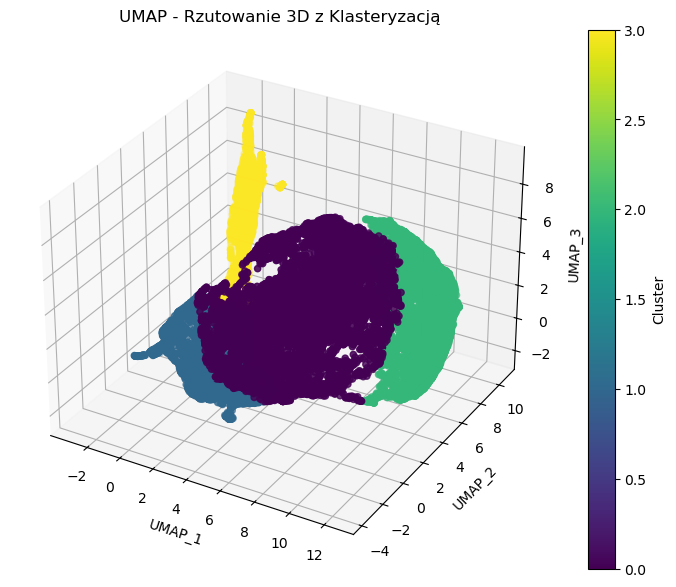

In [2]:
import pandas as pd
import numpy as np
from sklearn.metrics import pairwise_distances
import umap
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans

file_path = r"C:/Users/mikol/Documents/VisualizationTools/results1/combined_features_log.xlsx"
df = pd.read_excel(file_path)
df = df.drop(columns=['max_intensity'])
df = df.dropna()


selected_columns = ['area', 'perimeter', 'height', 'width', 'mean_intensity']
data = df[selected_columns] 

distance_matrix = pairwise_distances(data, metric='euclidean')

umap_model = umap.UMAP(n_components=3, metric='precomputed')
embedding = umap_model.fit_transform(distance_matrix)

df[['UMAP_1', 'UMAP_2', 'UMAP_3']] = embedding

num_clusters = 4
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(embedding)

df['Cluster'] = cluster_labels

df.to_excel(r"C:/Users/mikol/Documents/VisualizationTools/results1/combined_features_clusters4.xlsx", index=False)

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(embedding[:, 0], embedding[:, 1], embedding[:, 2], c=cluster_labels, cmap='viridis', s=20)
ax.set_title('UMAP - Rzutowanie 3D z Klasteryzacją')
ax.set_xlabel('UMAP_1')
ax.set_ylabel('UMAP_2')
ax.set_zlabel('UMAP_3')
plt.colorbar(scatter, ax=ax, label='Cluster')
plt.show()

In [3]:
import plotly.express as px

fig = px.scatter_3d(df, x='UMAP_1', y='UMAP_2', z='UMAP_3', color='Cluster', title="UMAP 3D - Klasteryzacja")
fig.show()

In [ ]:
import sys
!{sys.executable} -m pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

GROUP ONE CLUSTER

C:\Users\mikol\anaconda3\lib\site-packages\umap\umap_.py:1865: UserWarning: using precomputed metric; inverse_transform will be unavailable
  warn("using precomputed metric; inverse_transform will be unavailable")


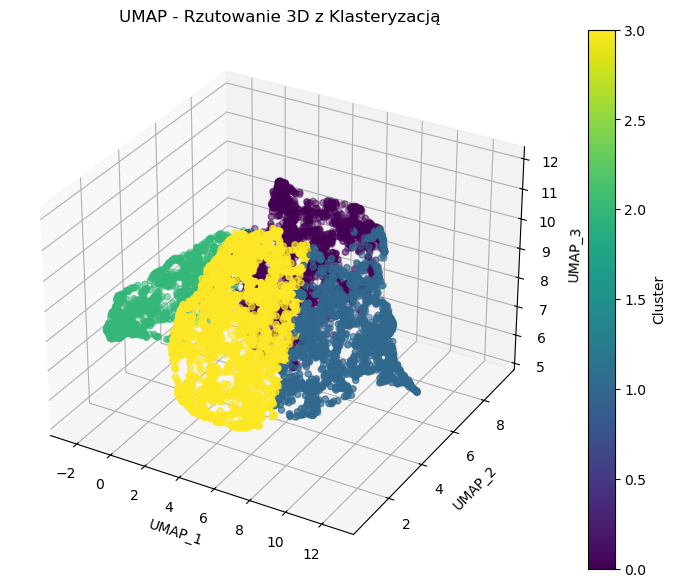

In [1]:
import pandas as pd
import numpy as np
from sklearn.metrics import pairwise_distances
import umap
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans

file_path = r"C:/Users/mikol/Documents/VisualizationTools/results1/combined_features_clusters.xlsx"
df = pd.read_excel(file_path)
df = df.dropna()

df = df[df['Cluster'] == 0]

selected_columns = ['area', 'perimeter', 'height', 'width', 'mean_intensity']
data = df[selected_columns] 

distance_matrix = pairwise_distances(data, metric='euclidean')

umap_model = umap.UMAP(n_components=3, metric='precomputed')  # 'precomputed' ze względu na użycie macierzy odległości
embedding = umap_model.fit_transform(distance_matrix)

df[['UMAP_1', 'UMAP_2', 'UMAP_3']] = embedding

num_clusters = 4
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(embedding)

df['Cluster'] = cluster_labels

#df.to_excel(r"C:/Users/mikol/Documents/VisualizationTools/results/combined_features_cluster_0.xlsx", index=False)

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(embedding[:, 0], embedding[:, 1], embedding[:, 2], c=cluster_labels, cmap='viridis', s=20)
ax.set_title('UMAP - Rzutowanie 3D z Klasteryzacją')
ax.set_xlabel('UMAP_1')
ax.set_ylabel('UMAP_2')
ax.set_zlabel('UMAP_3')
plt.colorbar(scatter, ax=ax, label='Cluster')
plt.show()

In [28]:
import plotly.express as px

fig = px.scatter_3d(df, x='UMAP_1', y='UMAP_2', z='UMAP_3', color='Cluster', title="UMAP 3D - Klasteryzacja")
fig.show()

DODATKOWE OBLICZENIA

In [ ]:
import numpy as np
from scipy import stats

file_path = r"C:/Users/mikol/Documents/VisualizationTools/results/combined_features_clusters.xlsx"
df = pd.read_excel(file_path)
df = df.dropna()
df0 = df[df['Cluster'] == 0]
df1 = df[df['Cluster'] == 1]
df2 = df[df['Cluster'] == 2]
df3 = df[df['Cluster'] == 3]
df4 = df[df['Cluster'] == 4]
resulta = stats.kruskal(df0['area'], df1['area'], df2['area'], df3['area'], df4['area'])
print(resulta)
area = pd.concat([df0['area'], df1['area'], df2['area'], df3['area'], df4['area']])
print(df0['area'].median(), df1['area'].median(), df2['area'].median(), df3['area'].median(), df4['area'].median())
resultp = stats.kruskal(df0['perimeter'], df1['perimeter'], df2['perimeter'], df3['perimeter'], df4['perimeter'])
print(resultp)
perim = pd.concat([df0['perimeter'], df1['perimeter'], df2['perimeter'], df3['perimeter'], df4['perimeter']])
print(df0['perimeter'].median(), df1['perimeter'].median(), df2['perimeter'].median(), df3['perimeter'].median(), df4['perimeter'].median())
resulth = stats.kruskal(df0['height'], df1['height'], df2['height'], df3['height'], df4['height'])
print(resulth)
hei = pd.concat([df0['height'], df1['height'], df2['height'], df3['height'], df4['height']])
print(df0['height'].median(), df1['height'].median(), df2['height'].median(), df3['height'].median(), df4['height'].median())
resultw = stats.kruskal(df0['width'], df1['width'], df2['width'], df3['width'], df4['width'])
print(resultw)
wid = pd.concat([df0['width'], df1['width'], df2['width'], df3['width'], df4['width']])
print(df0['width'].median(), df1['width'].median(), df2['width'].median(), df3['width'].median(), df4['width'].median())
resulti = stats.kruskal(df0['mean_intensity'], df1['mean_intensity'], df2['mean_intensity'], df3['mean_intensity'], df4['mean_intensity'])
print(resulti)
inten = pd.concat([df0['mean_intensity'], df1['mean_intensity'], df2['mean_intensity'], df3['mean_intensity'], df4['mean_intensity']])
print(df0['mean_intensity'].median(), df1['mean_intensity'].median(), df2['mean_intensity'].median(), df3['mean_intensity'].median(), df4['mean_intensity'].median())

print(df0.corr())
print(df1.corr())
print(df2.corr())
print(df3.corr())
print(df4.corr())

In [28]:
import pandas as pd
import numpy as np
from sklearn.metrics import pairwise_distances
import umap
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans
from scipy import stats

file_path = r"C:/Users/mikol/Documents/VisualizationTools/results/combined_features_clusters.xlsx"
df = pd.read_excel(file_path)
df = df.dropna()

df['id_prefix'] = df['id'].str[:5]

result = df.groupby(['id_prefix', 'Cluster']).size().reset_index(name='count')
result.to_excel(r"C:/Users/mikol/Documents/VisualizationTools/results/Alicz_pacjenci_klastry.xlsx", index=False)
print(result)

    id_prefix  Cluster  count
0       A0001        0     11
1       A0001        2      1
2       A0001        3      1
3       A0001        4      7
4       A0002        0     13
..        ...      ...    ...
917     G0062        0    117
918     G0062        1      8
919     G0062        2    164
920     G0062        3      3
921     G0062        4     44

[922 rows x 3 columns]


EXTRACT IMAGE FRAGMENTS

In [ ]:
import os
import cv2
import numpy as np

def get_user_input():
    print("=== Annotation Visualization ===")
    dicom_mode = input("Podaj tryb DICOM (CT/PET) [domyślnie CT]: ").strip() or "CT"
    while dicom_mode not in ['CT', 'PET']:
        print("Nieprawidłowy wybór. Wybierz 'CT' lub 'PET'.")
        dicom_mode = input("Podaj tryb DICOM (CT/PET): ").strip()

    dicom_path = input("Podaj ścieżkę do folderu z plikami DICOM (.DCM): ").strip()
    while not os.path.isdir(dicom_path):
        print("Nie znaleziono folderu. Spróbuj ponownie.")
        dicom_path = input("Podaj poprawną ścieżkę do folderu z plikami DICOM (.DCM): ").strip()

    annotation_path = input("Podaj ścieżkę do folderu z plikami XML lub do pojedynczego pliku XML: ").strip()
    while not (os.path.isdir(annotation_path) or os.path.isfile(annotation_path)):
        print("Nie znaleziono pliku/folderu. Spróbuj ponownie.")
        annotation_path = input("Podaj poprawną ścieżkę: ").strip()

    classfile = input("Podaj ścieżkę do pliku kategorii (domyślnie category.txt): ").strip() or "category.txt"
    if not os.path.isfile(classfile):
        print(f"Uwaga: Plik kategorii '{classfile}' nie istnieje. Domyślne wartości mogą być błędne.")

    return {
        'dicom_mode': dicom_mode,
        'dicom_path': dicom_path,
        'annotation_path': annotation_path,
        'classfile': classfile
    }

def save_image(img_name, img_np, img_data, label_list, save_folder):
    if img_np is None:
        print(f"Nie udało się załadować obrazu: {img_name}")
        return

    mask_img = np.zeros_like(img_np, dtype=np.uint8)

    for rect in img_data:
        bounding_box = [rect[0], rect[1], rect[2], rect[3]]
        xmin = int(bounding_box[0])
        ymin = int(bounding_box[1])
        xmax = int(bounding_box[2])
        ymax = int(bounding_box[3])

        region = img_np[ymin:ymax, xmin:xmax]

        mask_img[ymin:ymax, xmin:xmax] = region

    _, thresh = cv2.threshold(mask_img, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        x, y, w, h = cv2.boundingRect(contours[0])
        cropped_img = mask_img[y:y+h, x:x+w]

        output_path = os.path.join(save_folder, f"{img_name}_cropped.png")

        cv2.imwrite(output_path, cropped_img)
        print(f"Obraz zapisany: {output_path}")
    else:
        print("Brak wykrytych konturów!")

def main():
    args = get_user_input()
    class_list = get_category(args['classfile'])
    num_classes = len(class_list)
    dict = getUID_path(args['dicom_path'])

    save_folder = r"C:\Users\mikol\Documents\VisualizationTools\ExtractedFragments"
    
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    if os.path.isdir(args['annotation_path']):
        annotations = XML_preprocessor(args['annotation_path'], num_classes=num_classes).data
        for k, v in annotations.items():
            dcm_path, dcm_name = dict[k[:-4]]
            image_data = v

            if args['dicom_mode'] == 'CT':
                matrix, frame_num, width, height, ch = loadFile(os.path.join(dcm_path))
                img_bitmap = MatrixToImage(matrix[0], ch)
            elif args['dicom_mode'] == 'PET':
                img_array, frame_num, width, height, ch = loadFile(dcm_path)
                img_bitmap = PETToImage(img_array, color_reversed=True)

            save_image(img_name=dcm_name, img_np=img_bitmap, img_data=image_data, label_list=class_list, save_folder=save_folder)

    elif os.path.isfile(args['annotation_path']):
        xml_name = os.path.basename(args['annotation_path'])
        dcm_path, dcm_name = dict[xml_name[:-4]]
        _, image_data = get_gt(os.path.join(args['annotation_path']), num_class=num_classes)

        if args['dicom_mode'] == 'CT':
            matrix, frame_num, width, height, ch = loadFile(os.path.join(dcm_path))
            img_bitmap = MatrixToImage(matrix[0], ch)
        elif args['dicom_mode'] == 'PET':
            img_array, frame_num, width, height, ch = loadFile(dcm_path)
            img_bitmap = PETToImage(img_array, color_reversed=True)

        save_image(img_name=dcm_name, img_np=img_bitmap, img_data=image_data, label_list=class_list, save_folder=save_folder)


if __name__ == '__main__':
    main()


In [ ]:
import os
import cv2
import numpy as np

def save_image(img_name_prefix, img_np, img_data, save_folder, img_counter):
    if img_np is None:
        print(f"Nie udało się załadować obrazu: {img_name_prefix}")
        return img_counter

    mask_img = np.zeros_like(img_np, dtype=np.uint8)

    for rect in img_data:
        bounding_box = [rect[0], rect[1], rect[2], rect[3]]
        xmin = int(bounding_box[0])
        ymin = int(bounding_box[1])
        xmax = int(bounding_box[2])
        ymax = int(bounding_box[3])

        region = img_np[ymin:ymax, xmin:xmax]
        
        mask_img[ymin:ymax, xmin:xmax] = region 
        
        if len(mask_img.shape) > 2 and mask_img.shape[2] == 3:
            mask_img = cv2.cvtColor(mask_img, cv2.COLOR_BGR2GRAY)

    _, thresh = cv2.threshold(mask_img, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


    if contours:
        x, y, w, h = cv2.boundingRect(contours[0])
        cropped_img = mask_img[y:y+h, x:x+w]

        output_filename = f"{img_name_prefix}_img{img_counter}.png"
        output_path = os.path.join(save_folder, output_filename)

        cv2.imwrite(output_path, cropped_img)
        print(f"Obraz zapisany: {output_path}")
        img_counter += 1
    else:
        print("Brak wykrytych konturów!")

    return img_counter

def process_folder(dicom_path, annotation_path, save_folder):
    """Przetwarza folder z danymi DICOM i Annotation."""
    folder_name = os.path.basename(annotation_path)
    print(f"Przetwarzanie: DICOM: {dicom_path}, Annotation: {annotation_path}")

    try:
        classfile = "category.txt"
        class_list = get_category(classfile)
        num_classes = len(class_list)
        dict = getUID_path(dicom_path)

        annotations = XML_preprocessor(annotation_path, num_classes=num_classes).data
        img_counter = 1

        for k, v in annotations.items():
            dcm_path, dcm_name = dict[k[:-4]]
            image_data = v

            matrix, frame_num, width, height, ch = loadFile(dcm_path)
            img_bitmap = MatrixToImage(matrix[0], ch)

            img_counter = save_image(
                img_name_prefix=folder_name,
                img_np=img_bitmap,
                img_data=image_data,
                save_folder=save_folder,
                img_counter=img_counter,
            )

    except Exception as e:
        print(f"Błąd podczas przetwarzania folderu: {dicom_path}. Szczegóły: {e}")

def main():
    root_folder = r"C:/Users/mikol/Documents/Lung-PET-CT-Dx"
    results_folder = r"C:/Users/mikol/Documents/VisualizationTools/ExtractedFragments"
    annotations_root = r"C:/Users/mikol/Documents/VisualizationTools/Data/Annotation"

    if not os.path.exists(results_folder):
        os.makedirs(results_folder)

    for folder_name in os.listdir(root_folder):
        dicom_path = os.path.join(root_folder, folder_name)
        annotation_path = os.path.join(annotations_root, folder_name[8:])

        if os.path.isdir(dicom_path) and os.path.isdir(annotation_path):
            process_folder(dicom_path, annotation_path, results_folder)
        else:
            print(f"Pominięto folder: {folder_name} - brak odpowiednich danych DICOM lub Annotation.")

if __name__ == '__main__':
    main()


SSIM

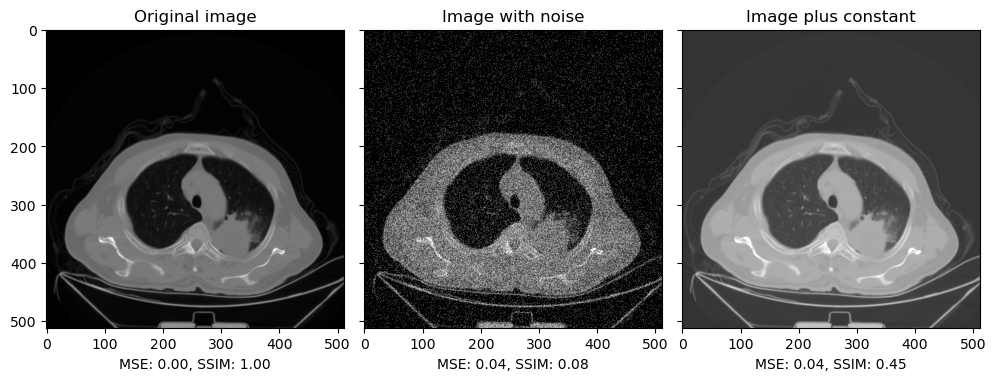

In [39]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error
import pydicom

dicom_path = r"C:\Users\mikol\Documents\VisualizationTools\ImagesWithMasks\A0001_mask_1.dcm"
dicom_data = pydicom.dcmread(dicom_path)

img = img_as_float(dicom_data.pixel_array)
img = (img - img.min()) / (img.max() - img.min())
rows, cols = img.shape

noise = np.ones_like(img) * 0.2 * (img.max() - img.min())
rng = np.random.default_rng()
noise[rng.random(size=noise.shape) > 0.5] *= -1

img_noise = img + noise
img_const = img + abs(noise)

mse_none = mean_squared_error(img, img)
ssim_none = ssim(img, img, data_range=img.max() - img.min())

mse_noise = mean_squared_error(img, img_noise)
ssim_noise = ssim(img, img_noise, data_range=img_noise.max() - img_noise.min())

mse_const = mean_squared_error(img, img_const)
ssim_const = ssim(img, img_const, data_range=img_const.max() - img_const.min())

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 4), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(img, cmap=plt.cm.gray, vmin=0, vmax=1)
ax[0].set_xlabel(f'MSE: {mse_none:.2f}, SSIM: {ssim_none:.2f}')
ax[0].set_title('Original image')

ax[1].imshow(img_noise, cmap=plt.cm.gray, vmin=0, vmax=1)
ax[1].set_xlabel(f'MSE: {mse_noise:.2f}, SSIM: {ssim_noise:.2f}')
ax[1].set_title('Image with noise')

ax[2].imshow(img_const, cmap=plt.cm.gray, vmin=0, vmax=1)
ax[2].set_xlabel(f'MSE: {mse_const:.2f}, SSIM: {ssim_const:.2f}')
ax[2].set_title('Image plus constant')

plt.tight_layout()
plt.show()


In [ ]:
import os
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim
import pandas as pd
from tqdm import tqdm

image_folder = r"C:\Users\mikol\Documents\VisualizationTools\ExtractedFragments"

def load_images_from_folder(folder, min_size=(3, 3)):
    """
    Wczytuje obrazy z folderu, filtrując obrazy poniżej minimalnego rozmiaru
    oraz obrazy jednorodne (wszystkie piksele mają tę samą wartość).
    """
    images = {}
    for filename in os.listdir(folder):
        file_path = os.path.join(folder, filename)
        if filename.lower().endswith('.png') and os.path.isfile(file_path):
            img = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
            if img is not None:
                if img.shape[0] < min_size[0] or img.shape[1] < min_size[1]:
                    print(f"Pomijam obraz {filename}, ponieważ jest zbyt mały: {img.shape}")
                    continue
                if np.all(img == img[0, 0]):
                    print(f"Pomijam obraz {filename}, ponieważ jest jednorodny.")
                    continue
                images[filename] = img
    return images

def resize_to_larger(image1, image2):
    """
    Dostosowuje obrazy do większego rozmiaru, dodając odpowiednią liczbę zerowych pikseli.
    """
    h1, w1 = image1.shape
    h2, w2 = image2.shape

    target_height = max(h1, h2)
    target_width = max(w1, w2)

    padded_image1 = np.zeros((target_height, target_width), dtype=np.uint8)
    padded_image2 = np.zeros((target_height, target_width), dtype=np.uint8)

    top1 = (target_height - h1) // 2
    left1 = (target_width - w1) // 2
    top2 = (target_height - h2) // 2
    left2 = (target_width - w2) // 2

    padded_image1[top1:top1 + h1, left1:left1 + w1] = image1
    padded_image2[top2:top2 + h2, left2:left2 + w2] = image2

    return padded_image1, padded_image2

def compute_ssim_matrix(images, win_size=7):
    image_names = list(images.keys())
    num_images = len(image_names)
    ssim_matrix = np.zeros((num_images, num_images))

    with tqdm(total=num_images * (num_images - 1) // 2, desc="Obliczanie SSIM") as pbar:
        for i in range(num_images):
            for j in range(i + 1, num_images):
                try:
                    img1, img2 = resize_to_larger(images[image_names[i]], images[image_names[j]])
                    ssim_value = ssim(img1, img2, win_size=win_size)
                except Exception as e:
                    print(f"Nie udało się obliczyć SSIM dla obrazów {image_names[i]} i {image_names[j]}: {e}")
                    ssim_value = 0.0
                
                ssim_matrix[i, j] = ssim_value
                ssim_matrix[j, i] = ssim_value
                pbar.update(1)

    return ssim_matrix, image_names

images = load_images_from_folder(image_folder)

if not images:
    raise ValueError("Brak obrazów spełniających minimalne wymagania rozmiaru!")

ssim_matrix, image_names = compute_ssim_matrix(images)

ssim_df = pd.DataFrame(ssim_matrix, index=image_names, columns=image_names)

output_excel = os.path.join(image_folder, "ssim_similarity_matrix.xlsx")
ssim_df.to_excel(output_excel, engine='openpyxl')

print(f"Macierz podobieństwa SSIM zapisana do: {output_excel}")


In [8]:
ssim_df = pd.DataFrame(ssim_matrix, index=image_names, columns=image_names)

output_csv = os.path.join(image_folder, "ssim_similarity_matrix.csv")
ssim_df.to_csv(output_csv, index=True)

print(f"Macierz podobieństwa SSIM zapisana do: {output_csv}")


Macierz podobieństwa SSIM zapisana do: C:\Users\mikol\Documents\VisualizationTools\ExtractedFragments\ssim_similarity_matrix.csv


In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import umap
import matplotlib.pyplot as plt

ssim_matrix_path = r"C:/Users/mikol/Documents/VisualizationTools/ExtractedFragments/ssim_similarity_matrix.csv"
ssim_df = pd.read_csv(ssim_matrix_path, index_col=0)

ssim_matrix = ssim_df.values
np.fill_diagonal(ssim_matrix, 1)
distance_matrix = 1 - ssim_matrix
np.fill_diagonal(distance_matrix, 0)


umap_model = umap.UMAP(n_components=3, metric="precomputed", random_state=42)
embedding = umap_model.fit_transform(distance_matrix)


num_clusters = 4
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(embedding)


new_table = pd.DataFrame({
    'Image': ssim_df.index,
    'UMAP_1': embedding[:, 0],
    'UMAP_2': embedding[:, 1],
    'UMAP_3': embedding[:, 2],
    'Cluster': cluster_labels
})


output_excel_path = r"C:/Users/mikol/Documents/VisualizationTools/ExtractedFragments/ssim_clusters4.xlsx"
new_table.to_excel(output_excel_path, index=False)

print(f"Nowa tabela została zapisana do: {output_excel_path}")


In [5]:
import plotly.express as px

fig = px.scatter_3d(new_table, x='UMAP_1', y='UMAP_2', z='UMAP_3', color='Cluster', title="UMAP 3D - Klasteryzacja")  
fig.show()

In [9]:
min_value = np.min(distance_matrix)

max_value = np.max(distance_matrix)

quantiles = np.percentile(distance_matrix, [25, 50, 75])

print(min_value)
print(max_value)
print(quantiles[0])
print(quantiles[1])
print(quantiles[2])

0.0
1.2393893677332346
0.8662712413454264
0.9274637020520817
0.967755190977476


In [16]:
ssim_matrix[ssim_matrix > 1] = 1
ssim_matrix = np.where(ssim_matrix > 0, ssim_matrix, 1e-10)

transformed_matrix = -np.log(ssim_matrix)

RESNET

In [ ]:
import os
import pandas as pd
import shutil

excel_file = r"C:\Users\mikol\Documents\VisualizationTools\ExtractedFragments\ssim_clusters4.xlsx"
source_folder = r"C:\Users\mikol\Documents\VisualizationTools\ImagesWithMasks"
destination_folder = r"C:\Users\mikol\Documents\VisualizationTools\ResNet_ssim"

os.makedirs(destination_folder, exist_ok=True)

df = pd.read_excel(excel_file)

filtered_ids = df[df['Cluster'].isin([2, 3])]['id'].tolist()

for file_name in os.listdir(source_folder):
    file_path = os.path.join(source_folder, file_name)
    if os.path.isfile(file_path) and file_name.endswith('.dcm') and file_name[:-4] in filtered_ids:
        shutil.copy(file_path, os.path.join(destination_folder, file_name))
        print(f"Skopiowano plik: {file_name}")
print("Kopiowanie zakończone!")


In [ ]:
import os
import numpy as np
import pydicom
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, models
from sklearn.cluster import KMeans
import umap
import pandas as pd
import matplotlib.pyplot as plt

dicom_folder = r"C:\Users\mikol\Documents\VisualizationTools\ResNet_ssim"
results_excel = r"C:\Users\mikol\Documents\VisualizationTools\ResNet18_ssim_pretrained_results.xlsx"

class DICOMDataset(Dataset):
    def __init__(self, folder, transform=None):
        self.folder = [
            os.path.join(folder, file) for file in os.listdir(folder) if file.endswith(".dcm")
        ]
        self.default_transform = transforms.Compose([ 
            transforms.Resize((224, 224)),
            transforms.Normalize(mean=[0.5], std=[0.5])
        ])
        self.transform = transform if transform else self.default_transform

    def __len__(self):
        return len(self.folder)

    def __getitem__(self, idx):
        file_path = self.folder[idx]
        try:
            dicom = pydicom.dcmread(file_path)
            image = dicom.pixel_array

            image = (image - np.min(image)) / (np.max(image) - np.min(image))
            image = image.astype(np.float32)
            
            if len(image.shape) == 3:  # Kolorowe obrazy (H, W, C)
                if image.shape[0] == 3:  # Jeśli pierwszy wymiar to kanały
                    image = np.transpose(image, (1, 2, 0))  # (C, H, W) -> (H, W, C)
                image = np.mean(image, axis=-1)  # Konwersja do skali szarości
            elif len(image.shape) == 2:  # Obrazy czarno-białe (H, W)
                pass
            else:
                raise ValueError(f"Nieobsługiwany rozmiar obrazu: {image.shape}")
            '''
            if len(image.shape) == 3:
                image = image[0, :, :]
            elif len(image.shape) == 2:
                pass
            else:
                raise ValueError(f"Nieobsługiwany rozmiar obrazu: {image.shape}")
            '''

            image = torch.tensor(image).unsqueeze(0)
            image = self.transform(image)

            return image, file_path
        except Exception as e:
            print(f"Błąd wczytywania pliku {file_path}: {e}")
            return None

def custom_collate_fn(batch):
    batch = list(filter(lambda x: x is not None, batch))
    images, paths = zip(*batch)
    images = torch.stack(images, dim=0)
    return images, paths

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    #transforms.Grayscale(num_output_channels=3),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

dataset = DICOMDataset(dicom_folder, transform=transform)
dataloader = DataLoader(dataset, batch_size=32, collate_fn=custom_collate_fn)


resnet18 = models.resnet18(pretrained=True)
resnet18.fc = nn.Identity()
resnet18.eval()

embeddings = []
file_paths = []

for images, paths in dataloader:
    images_rgb = images.repeat(1, 3, 1, 1)
    output = resnet18(images_rgb)
    embeddings.append(output.detach().numpy()) 
    file_paths.extend(paths) 

print(f"Liczba plików: {len(file_paths)}")
print(f"Liczba embeddingów: {len(embeddings)}")

embeddings = np.vstack(embeddings)
kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(embeddings)

umap_model = umap.UMAP(n_components=3, random_state=42)
umap_embeddings = umap_model.fit_transform(embeddings)

file_names = [os.path.splitext(os.path.basename(path))[0] for path in file_paths]

results = pd.DataFrame({
    "id": file_names,
    "Cluster": clusters,
    "UMAP_1": umap_embeddings[:, 0],
    "UMAP_2": umap_embeddings[:, 1],
    "UMAP_3": umap_embeddings[:, 2]
})

results.to_excel(results_excel, index=False, engine='openpyxl')
print(f"Wyniki zapisane do pliku Excel: {results_excel}")


In [ ]:
import os
import numpy as np
import pydicom
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, models
import pandas as pd
from sklearn.metrics import accuracy_score


dicom_folder = r"C:\Users\mikol\Documents\VisualizationTools\ResNet_extraction"
labels_path = r"C:\Users\mikol\Documents\VisualizationTools\labels_extraction.xlsx"
results_excel = r"C:\Users\mikol\Documents\VisualizationTools\ResNet18_extraction_pretrained_results.xlsx"

labels_df = pd.read_excel(labels_path)
labels_df['file_name'] = labels_df['id'] + ".dcm" 
available_files = set(os.listdir(dicom_folder))
labels_df = labels_df[labels_df['file_name'].isin(available_files)]

class DICOMDataset(Dataset):
    def __init__(self, folder, labels, transform=None):
        self.folder = folder
        self.labels = labels
        self.file_paths = labels['file_name'].values
        self.targets = labels['labels'].values 

        self.default_transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.Normalize(mean=[0.5], std=[0.5])
        ])
        self.transform = transform if transform else self.default_transform

    def __len__(self):
        return len(self.file_paths)

    def __getitem__(self, idx):
        file_path = os.path.join(self.folder, self.file_paths[idx])
        target = self.targets[idx]  
        try:
            dicom = pydicom.dcmread(file_path)
            image = dicom.pixel_array

            image = (image - np.min(image)) / (np.max(image) - np.min(image))
            image = image.astype(np.float32)
            if len(image.shape) == 3:  
                if image.shape[0] == 3: 
                    image = np.transpose(image, (1, 2, 0)) 
                image = np.mean(image, axis=-1)  
            elif len(image.shape) == 2: 
                pass
            else:
                raise ValueError(f"Nieobsługiwany rozmiar obrazu: {image.shape}")

            image = torch.tensor(image).unsqueeze(0)
            image = self.transform(image)

            return image, target, file_path
        except Exception as e:
            print(f"Błąd wczytywania pliku {file_path}: {e}")
            return None

        
def custom_collate_fn(batch):
    batch = list(filter(lambda x: x is not None, batch))
    images, targets, paths = zip(*batch)
    images = torch.stack(images, dim=0)
    targets = torch.tensor(targets, dtype=torch.long)
    return images, targets, paths


transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

dataset = DICOMDataset(dicom_folder, labels_df, transform=transform)
dataloader = DataLoader(dataset, batch_size=32, collate_fn=custom_collate_fn)

resnet18 = models.resnet18(pretrained=True)
num_features = resnet18.fc.in_features

resnet18.fc = nn.Linear(num_features, 2)
resnet18.eval()

predictions = []
true_labels = []
file_paths = []

for images, targets, paths in dataloader:
    images_rgb = images.repeat(1, 3, 1, 1)  
    with torch.no_grad(): 
        logits = resnet18(images_rgb)  
        probs = torch.softmax(logits, dim=1)  
        preds = torch.argmax(probs, dim=1)

        predictions.extend(preds.tolist()) 
        true_labels.extend(targets.tolist()) 
        file_paths.extend(paths) 


accuracy = accuracy_score(true_labels, predictions)
print(f"Dokładność modelu: {accuracy:.4f}")


file_names = [os.path.splitext(os.path.basename(path))[0] for path in file_paths]
results = pd.DataFrame({
    "id": file_names,
    "True_Label": true_labels,
    "Predicted_Class": predictions
})


results.to_excel(results_excel, index=False, engine='openpyxl')
print(f"Wyniki zapisane do pliku Excel: {results_excel}")


Epoch 1/15, Loss: 123.1673
Epoch 2/15, Loss: 47.9214
Epoch 3/15, Loss: 18.3020
Epoch 4/15, Loss: 14.1858
Epoch 5/15, Loss: 9.7007
Epoch 6/15, Loss: 4.0465
Epoch 7/15, Loss: 2.5076
Epoch 8/15, Loss: 2.1747
Epoch 9/15, Loss: 1.9747
Epoch 10/15, Loss: 1.7645
Epoch 11/15, Loss: 1.4200
Epoch 12/15, Loss: 1.3625
Epoch 13/15, Loss: 1.3093
Epoch 14/15, Loss: 1.3037
Epoch 15/15, Loss: 1.4256
Dokładność na danych testowych: 0.9890


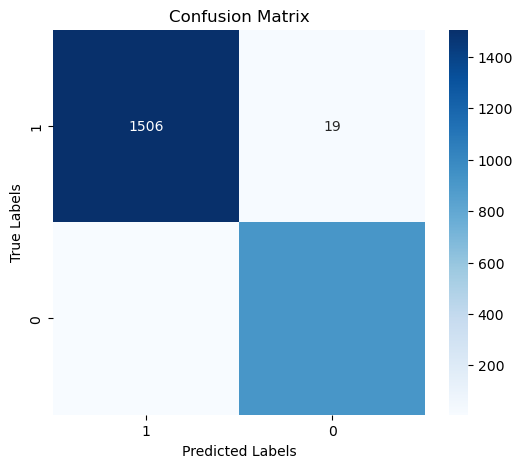

Wyniki zapisane do pliku Excel: C:\Users\mikol\Documents\VisualizationTools\ResNet18_ssim_trained_results.xlsx


In [1]:
import os
import numpy as np
import pandas as pd
import pydicom
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import transforms, models
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


dicom_folder = r"C:\Users\mikol\Documents\VisualizationTools\ResNet_ssim"
labels_path = r"C:\Users\mikol\Documents\VisualizationTools\labels_ssim.xlsx"
results_excel = r"C:\Users\mikol\Documents\VisualizationTools\ResNet18_ssim_trained_results.xlsx"

labels_df = pd.read_excel(labels_path)
labels_df['fSile_name'] = labels_df['id'] + ".dcm"
available_files = set(os.listdir(dicom_folder))
labels_df = labels_df[labels_df['file_name'].isin(available_files)]


class DICOMDataset(Dataset):
    def __init__(self, folder, labels, transform=None):
        self.folder = folder
        self.labels = labels
        self.file_paths = labels['file_name'].values
        self.targets = labels['labels'].values

        self.default_transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.Normalize(mean=[0.5], std=[0.5])
        ])
        self.transform = transform if transform else self.default_transform

    def __len__(self):
        return len(self.file_paths)

    def __getitem__(self, idx):
        file_path = os.path.join(self.folder, self.file_paths[idx])
        target = self.targets[idx]
        try:
            dicom = pydicom.dcmread(file_path)
            image = dicom.pixel_array

            image = (image - np.min(image)) / (np.max(image) - np.min(image))
            image = image.astype(np.float32)
            if len(image.shape) == 3:
                image = np.mean(image, axis=-1)
            image = torch.tensor(image).unsqueeze(0)
            image = self.transform(image)

            return image, target
        except Exception as e:
            print(f"Błąd wczytywania pliku {file_path}: {e}")
            return None


def custom_collate_fn(batch):
    batch = list(filter(lambda x: x is not None, batch))
    images, targets = zip(*batch)
    images = torch.stack(images, dim=0)
    targets = torch.tensor(targets, dtype=torch.long)
    return images, targets


transform = trasnsforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

dataset = DICOMDataset(dicom_folder, labels_df, transform=transform)


train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, collate_fn=custom_collate_fn)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, collate_fn=custom_collate_fn)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet18 = models.resnet18()
resnet18.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
num_features = resnet18.fc.in_features
resnet18.fc = nn.Linear(num_features, len(labels_df['labels'].unique()))
resnet18 = resnet18.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(resnet18.parameters(), lr=0.01, momentum=0.9)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)


epochs = 15
for epoch in range(epochs):
    resnet18.train()
    epoch_loss = 0
    for images, targets in train_loader:
        images, targets = images.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = resnet18(images)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    scheduler.step()
    print(f"Epoch {epoch + 1}/{epochs}, Loss: {epoch_loss:.4f}")


resnet18.eval()
all_targets = []
all_predictions = []

with torch.no_grad():
    for images, targets in test_loader:
        images = images.to(device)
        outputs = resnet18(images)
        _, predicted = torch.max(outputs, 1)
        all_targets.extend(targets.numpy())
        all_predictions.extend(predicted.cpu().numpy())

accuracy = accuracy_score(all_targets, all_predictions)
print(f"Dokładność na danych testowych: {accuracy:.4f}")

cm = confusion_matrix(all_targets, all_predictions)
labels = labels_df['labels'].unique()

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()


results = pd.DataFrame({
    "id": labels_df['id'].iloc[test_dataset.indices].values,
    "True_Label": all_targets,
    "Predicted_Label": all_predictions
})
results.to_excel(results_excel, index=False, engine='openpyxl')
print(f"Wyniki zapisane do pliku Excel: {results_excel}")


In [48]:
from sklearn.metrics import confusion_matrix, accuracy_score

cm = confusion_matrix(all_targets, all_predictions)

TP = cm[1, 1] 
FP = cm[0, 1]  
FN = cm[1, 0] 
TN = cm[0, 0]  

print(f"True Positives (TP): {TP}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Negatives (TN): {TN}")

accuracy = accuracy_score(all_targets, all_predictions)
print(f"Accuracy: {accuracy:.4f}")

True Positives (TP): 918
False Positives (FP): 12
False Negatives (FN): 11
True Negatives (TN): 1507
Accuracy: 0.9906


In [ ]:
import torch
model_path = r"C:\Users\mikol\Documents\VisualizationTools\resnet50_model.pth"
#torch.save(resnet50, model_path)
#print(f"Model zapisano w: {model_path}")

resnet50 = torch.load(model_path)
#resnet50.eval()

In [ ]:
from torch.autograd import Variable

saliency_folder = r"C:\Users\mikol\Documents\VisualizationTools\SaliencyMaps18_extraction_pretrained2"

if not os.path.exists(saliency_folder):
    os.makedirs(saliency_folder)
    
'''
class DICOMDataset(Dataset):
    def __init__(self, folder, labels, transform=None):
        self.folder = folder
        self.labels = labels
        self.file_paths = labels['file_name'].values
        self.targets = labels['labels'].values

        self.default_transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.Normalize(mean=[0.5], std=[0.5])
        ])
        self.transform = transform if transform else self.default_transform

    def __len__(self):
        return len(self.file_paths)

    def __getitem__(self, idx):
        file_path = os.path.join(self.folder, self.file_paths[idx])
        target = self.targets[idx]
        try:
            dicom = pydicom.dcmread(file_path)
            image = dicom.pixel_array
    
            image = (image - np.min(image)) / (np.max(image) - np.min(image))
            image = image.astype(np.float32)
            
            #if len(image.shape) == 3:
            #    image = image[0, :, :]
            #elif len(image.shape) == 2:
            #    pass
            #else:
            #    raise ValueError(f"Nieobsługiwany rozmiar obrazu: {image.shape}")
            
            if len(image.shape) == 3:  # Kolorowe obrazy (H, W, C)
                if image.shape[0] == 3:  # Jeśli pierwszy wymiar to kanały
                    image = np.transpose(image, (1, 2, 0))  # (C, H, W) -> (H, W, C)
                image = np.mean(image, axis=-1)  # Konwersja do skali szarości
            elif len(image.shape) == 2:  # Obrazy czarno-białe (H, W)
                pass
            else:
                raise ValueError(f"Nieobsługiwany rozmiar obrazu: {image.shape}")
            
            image = torch.tensor(image).unsqueeze(0)
            image = self.transform(image)
    
            return image, target, file_path 
        except Exception as e:
            print(f"Błąd wczytywania pliku {file_path}: {e}")
            return None


def custom_collate_fn(batch):
    batch = list(filter(lambda x: x is not None, batch))
    images, targets, file_paths = zip(*batch)
    images = torch.stack(images, dim=0)
    targets = torch.tensor(targets, dtype=torch.long)
    return images, targets, file_paths


transform = transforms.Compose([
    transforms.Resize((224, 224)),
    #transforms.Grayscale(num_output_channels=3),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

dataset = DICOMDataset(dicom_folder, labels_df, transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True, collate_fn=custom_collate_fn)
'''

def generate_saliency_maps(model, images, file_paths, saliency_folder):
    model.eval()
    for i, (image, file_path) in enumerate(zip(images, file_paths)):
        image = image.unsqueeze(0)
        image.requires_grad_()
        
        output = model(image)
        target_class = torch.argmax(output)

        model.zero_grad()
        output[0, target_class].backward()

        saliency = image.grad.abs().squeeze().cpu().numpy()
        saliency = np.max(saliency, axis=0)

        saliency -= saliency.min()
        if saliency.max() > 0:
            saliency /= saliency.max()

        file_name = os.path.splitext(os.path.basename(file_path))[0]
        saliency_path = os.path.join(saliency_folder, f"{file_name}_saliency.png")

        plt.imsave(saliency_path, saliency, cmap="hot")

for images, _, paths in dataloader:
    images_rgb = images.repeat(1, 3, 1, 1)
    generate_saliency_maps(resnet18, images_rgb, paths, saliency_folder)
    
'''
def generate_saliency_maps(model, images, file_paths, saliency_folder):
    model.eval()
    for i, (image, file_path) in enumerate(zip(images, file_paths)):
        #image = image.unsqueeze(0).to(torch.float32)  # Dodaj wymuszenie typu float32
        image = image.unsqueeze(0).to(torch.float32).to(next(model.parameters()).device)
        image.requires_grad_()
        
        output = model(image)
        target_class = torch.argmax(output)
        print(target_class)

        model.zero_grad()
        output[0, target_class].backward()

        saliency = image.grad.abs().squeeze().cpu().numpy()
        
        if len(saliency.shape) > 2:
            saliency = np.max(saliency, axis=0)

        saliency -= saliency.min()
        if saliency.max() > 0:
            saliency /= saliency.max()


        file_name = os.path.splitext(os.path.basename(file_path))[0]
        saliency_path = os.path.join(saliency_folder, f"{file_name}_saliency.png")

        plt.imsave(saliency_path, saliency, cmap="hot")
        #print(f"Zapisano mapę saliency dla {file_name}: {saliency_path}")

for images, _, paths in dataloader:
    generate_saliency_maps(resnet18, images, paths, saliency_folder)

 '''


In [49]:
import plotly.express as px

fig = px.scatter_3d(results, x='UMAP_1', y='UMAP_2', z='UMAP_3', color='Cluster', title="UMAP 3D, ResNet Klasteryzacja")  
fig.show()

SSIM SALIENCY

In [2]:
import os
import random
import shutil

image_folder = r"C:\Users\mikol\Documents\VisualizationTools\SaliencyMaps50_trained"
destination_folder = r"C:\Users\mikol\Documents\VisualizationTools\ssim_saliency_trained"

os.makedirs(destination_folder, exist_ok=True)

all_images = [f for f in os.listdir(image_folder) if f.lower().endswith('.png')]

if not all_images:
    raise ValueError("Brak obrazów w folderze źródłowym!")

random.seed(42)
selected_images = random.sample(all_images, len(all_images) // 2)

for image_name in selected_images:
    src_path = os.path.join(image_folder, image_name)
    dst_path = os.path.join(destination_folder, image_name)
    shutil.copy2(src_path, dst_path)

print(f"Skopiowano {len(selected_images)} obrazów do folderu: {destination_folder}")


In [14]:
import os
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim
import pandas as pd
from tqdm import tqdm

folder1 = r"C:\Users\mikol\Documents\VisualizationTools\SaliencyMaps18_extraction_pretrained"
folder2 = r"C:\Users\mikol\Documents\VisualizationTools\SaliencyMaps18_extraction_trained"

output_excel = os.path.join(folder2, "ssim_saliency_norm_extraction.xlsx")


def load_grayscale_images(folder):
    """
    Wczytuje obrazy z folderu i konwertuje je na skalę szarości.
    """
    images = {}
    for filename in os.listdir(folder):
        file_path = os.path.join(folder, filename)
        if filename.lower().endswith('.png') and os.path.isfile(file_path):
            img = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
            if img is not None:
                images[filename] = img
    return images


def compute_ssim_for_pairs(images1, images2):
    """
    Oblicza SSIM dla odpowiadających sobie obrazów z dwóch folderów.
    """
    ssim_values = []
    filenames = []

    with tqdm(total=len(images1), desc="Obliczanie SSIM dla par") as pbar:
        for filename, img1 in images1.items():
            if filename in images2:
                img2 = images2[filename]
                try:
                    ssim_value = ssim(img1, img2)
                except Exception as e:
                    print(f"Nie udało się obliczyć SSIM dla obrazu {filename}: {e}")
                    ssim_value = 0.0
                ssim_values.append(ssim_value)
                filenames.append(filename)
            else:
                print(f"Brak odpowiadającego obrazu w drugim folderze dla: {filename}")
            pbar.update(1)

    return filenames, ssim_values


images1 = load_grayscale_images(folder1)
images2 = load_grayscale_images(folder2)

if not images1 or not images2:
    raise ValueError("Jeden z folderów nie zawiera obrazów!")

filenames, ssim_values = compute_ssim_for_pairs(images1, images2)

ssim_df = pd.DataFrame({'Filename': filenames, 'SSIM': ssim_values})
ssim_df.to_excel(output_excel, index=False, engine='openpyxl')

print(f"Wyniki SSIM zapisano do: {output_excel}")


Obliczanie SSIM dla par: 100%|██████████████████████████████████████████████████| 12995/12995 [00:34<00:00, 374.93it/s]


Wyniki SSIM zapisano do: C:\Users\mikol\Documents\VisualizationTools\SaliencyMaps18_extraction_trained\ssim_saliency_extraction.xlsx


In [ ]:
import os
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim
import pandas as pd
from tqdm import tqdm

# Ścieżki do folderów z obrazami
folder1 = r"C:\Users\mikol\Documents\VisualizationTools\SaliencyMaps18_extraction_pretrained"
folder2 = r"C:\Users\mikol\Documents\VisualizationTools\SaliencyMaps18_extraction_trained"

# Ścieżka do pliku wynikowego
output_excel = os.path.join(folder2, "ssim_saliency_norm_ssim.xlsx")


def min_max_normalize_image(img):
    """
    Normalizuje obraz do zakresu [0, 1] w oparciu o lokalne min i max.
    """
    min_val = np.min(img)
    max_val = np.max(img)
    if max_val - min_val == 0:
        print(f"Obraz jednorodny: min={min_val}, max={max_val}. Zwracam macierz zerową.")
        return np.zeros_like(img, dtype=np.float32)  # Jeśli obraz jest jednorodny, zwróć macierz zerową
    normalized_img = (img - min_val) / (max_val - min_val)
    return normalized_img.astype(np.float32)


def load_and_normalize_images(folder):
    """
    Wczytuje obrazy z folderu, konwertuje je na skalę szarości i normalizuje metodą min-max.
    """
    images = {}
    for filename in os.listdir(folder):
        file_path = os.path.join(folder, filename)
        if filename.lower().endswith('.png') and os.path.isfile(file_path):
            img = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
            if img is not None:
                normalized_img = min_max_normalize_image(img)
                images[filename] = normalized_img
    return images


def compute_ssim_for_pairs(images1, images2):
    """
    Oblicza SSIM dla odpowiadających sobie obrazów z dwóch folderów.
    """
    ssim_values = []
    filenames = []

    with tqdm(total=len(images1), desc="Obliczanie SSIM dla par") as pbar:
        for filename, img1 in images1.items():
            if filename in images2:
                img2 = images2[filename]
                try:
                    # Obliczanie SSIM
                    ssim_value = ssim(img1, img2, data_range=1.0)  # Zakres danych dla znormalizowanych obrazów
                except Exception as e:
                    print(f"Nie udało się obliczyć SSIM dla obrazu {filename}: {e}")
                    ssim_value = 0.0
                ssim_values.append(ssim_value)
                filenames.append(filename)
            else:
                print(f"Brak odpowiadającego obrazu w drugim folderze dla: {filename}")
            pbar.update(1)

    return filenames, ssim_values


# Wczytanie i normalizacja obrazów
images1 = load_and_normalize_images(folder1)
images2 = load_and_normalize_images(folder2)

if not images1 or not images2:
    raise ValueError("Jeden z folderów nie zawiera obrazów!")

# Obliczanie SSIM dla odpowiadających sobie obrazów
filenames, ssim_values = compute_ssim_for_pairs(images1, images2)

# Tworzenie i zapis wynikowego DataFrame
ssim_df = pd.DataFrame({'Filename': filenames, 'SSIM': ssim_values})
ssim_df.to_excel(output_excel, index=False, engine='openpyxl')

print(f"Wyniki SSIM zapisano do: {output_excel}")


In [2]:
import pandas as pd

# Ścieżka do pliku tekstowego i do zapisu Excela
text_file_path = 'C:/Users/mikol/Downloads/SSIM.txt'
excel_file_path = 'C:/Users/mikol/Downloads/SSIM_Clusters2.xlsx'

# Wczytaj dane z pliku tekstowego
data = pd.read_csv(text_file_path, sep='\t', header=0)

# Zapisz dane do pliku Excel
data.to_excel(excel_file_path, index=False, engine='openpyxl')

print(f"Dane zostały zapisane do pliku Excel: {excel_file_path}")


Dane zostały zapisane do pliku Excel: C:/Users/mikol/Downloads/SSIM_Clusters2.xlsx
